## 🐑 Кластеризация по позиции игроков

In [1]:
import numpy as np
import seaborn as sns
from sklearn import metrics
from matplotlib import pyplot as plt
import pandas as pd


plt.rcParams['figure.figsize'] = (12, 9)
plt.rcParams['font.family'] = 'DejaVu Sans'

%matplotlib inline
%config InlineBackend.figure_format="retina"

RANDOM_STATE = 42

### 🦆 Считываем данные игроков

In [72]:
#☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️
files = [f'{i}_advanced_plus_totals.csv' for i in range(2011, 2022)]
for idx, file in enumerate(files):
    if idx == 0:
        df = pd.read_csv(f'../data/{file}')
        df['year'] = int(file[:4])
    else:
        df_loc = pd.read_csv(f'../data/{file}')
        df_loc['year'] = int(file[:4])
        df = pd.concat([df, df_loc])
df = df.drop(['Salary'], axis=1)
df.sample(10)

,Player,Pos,Age,Tm,G,GS,MP,FG,FGA,FG%,...,STL%,TOV%,TRB%,TS%,USG%,VORP,WS,WS/48,SalaryAdj,year
133,Draymond Green,PF,26,GSW,76,76,2471,272,650,0.418,...,3.0,19.8,13.3,0.522,16.2,4.3,8.2,0.160,19838339.0,2017
322,Kenrich Williams,SF,24,NOP,46,29,1079,107,279,0.384,...,1.9,11.1,10.5,0.485,12.3,0.0,1.2,0.053,1639040.0,2019
394,Derrick White,SG,26,SAS,36,32,1064,186,453,0.411,...,1.2,8.2,5.4,0.550,22.4,0.9,1.9,0.085,17099011.0,2021
319,Bobby Portis,C,25,MIL,66,7,1372,313,598,0.523,...,1.8,8.2,17.9,0.598,20.9,1.2,4.8,0.167,4741482.0,2021
74,Jamal Crawford,SG,30,ATL,76,0,2297,368,874,0.421,...,1.3,12.8,3.4,0.545,23.4,0.6,3.4,0.071,6563626.0,2011
189,Jeremy Lamb,SG,26,CHO,79,55,2250,431,979,0.440,...,1.9,6.8,10.4,0.552,22.5,1.8,5.3,0.113,12146595.0,2019
322,Taurean Prince,PF,26,TOT,41,10,905,131,327,0.401,...,1.5,11.5,8.8,0.540,19.6,0.0,1.0,0.052,14542437.0,2021
2,Cole Aldrich,C,24,TOT,45,0,388,44,80,0.550,...,0.7,20.6,17.7,0.563,12.7,-0.1,0.6,0.070,1122146.0,2013
299,Marreese Speights,C,25,TOT,79,3,1300,260,584,0.445,...,1.0,10.8,17.4,0.498,25.8,-0.2,2.8,0.104,4441416.0,2013
150,Gerald Henderson,SG,29,PHI,72,41,1667,234,553,0.423,...,1.2,9.0,6.1,0.529,17.9,-0.5,2.0,0.059,1209654.0,2017


### 🐰 Смотрим значения позиций

In [73]:
df.Pos.unique()

array(['SG', 'C', 'PF', 'SF', 'PG', 'SF-SG', 'PG-SG', 'PF-SF', 'SG-PG',
       'SF-PF', 'C-PF', 'SG-SF', 'PF-C', 'SG-PF', 'SF-C'], dtype=object)

In [74]:
#'SF-SG': 3
dic = {'SG': 0, 'C': 1, 'PF': 2, 'SF': 3, 'PG': 4, 'SF-SG': 3, 'PG-SG': 4, 'PF-SF': 2, 'SG-PG': 0,
       'SF-PF': 3, 'C-PF': 1, 'SG-SF': 0, 'PF-C': 2, 'SG-PF': 0, 'SF-C': 3}
y = [dic[i] for i in df.Pos.values]

In [98]:
#'SF-SG': 0
#'PG-SG': 4
#'PF-SF': 3
dic = {'SG': 0, 'C': 1, 'PF': 2, 'SF': 3, 'PG': 4, 'SF-SG': 3, 'PG-SG': 4, 'PF-SF': 3, 'SG-PG': 0,
       'SF-PF': 3, 'C-PF': 1, 'SG-SF': 0, 'PF-C': 2, 'SG-PF': 0, 'SF-C': 3}
y = [dic[i] for i in df.Pos.values]

In [3]:
#'SF-SG': 0
#'PG-SG': 4
#'PF-SF': 3
#'SG-PG': 4
dic = {'SG': 0, 'C': 1, 'PF': 2, 'SF': 3, 'PG': 4, 'SF-SG': 3, 'PG-SG': 4, 'PF-SF': 3, 'SG-PG': 4,
       'SF-PF': 3, 'C-PF': 1, 'SG-SF': 0, 'PF-C': 2, 'SG-PF': 0, 'SF-C': 3}
y = [dic[i] for i in df.Pos.values]

In [4]:
#'G': 0
#'F': 1
#'C': 2
dic = {'SG': 0, 'C': 2, 'PF': 1, 'SF': 1, 'PG': 0, 'SF-SG': 1, 'PG-SG': 0, 'PF-SF': 1, 'SG-PG': 0,
       'SF-PF': 1, 'C-PF': 2, 'SG-SF': 0, 'PF-C': 1, 'SG-PF': 0, 'SF-C': 1}
y = [dic[i] for i in df.Pos.values]

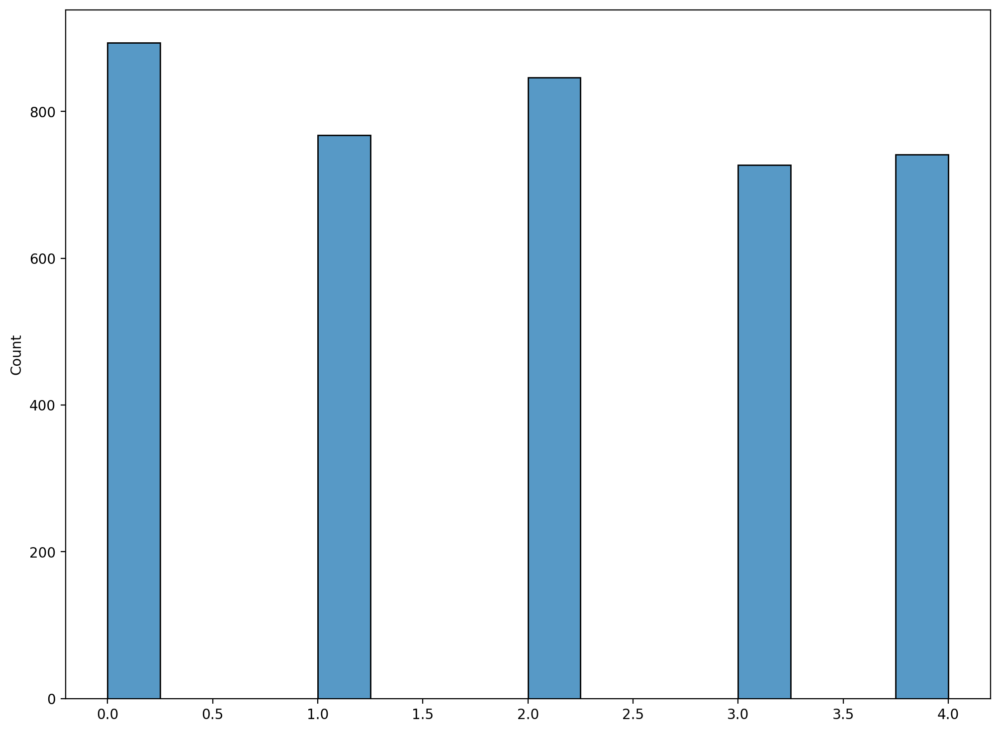

In [75]:
sns.histplot(y);

### 🐘 Эти метки соответствуют:

'SG' - атакующий защитник 0 - 0, 

'C' - центральный 1 - 1, 

'PF' - мощный форвард 2 - 2, 

'SF' - легкий форвард 3 - 3, 

'PG' - разыгрывающий 4 - 4, 

'SF-SG' - 5 - 3, 

'PG-SG' - 6 - 4, 

'PF-SF' - 7 - 2, 

'SG-PG' - 8 - 0,

'SF-PF' - 9 - 3, 

'C-PF' - 10 - 1, 

'SG-SF' - 11 - 0, 

'PF-C' - 12 - 2, 

'SG-PF' - 13 - 0, 

'SF-C' - 14 - 3

### 🦍 Разделим признаки по типам:

In [76]:
#☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️
continuous_cols_full = ['year','Age', 'G', 'GS', 'MP', 'FG', 'FGA', 'FG%', '3P', '3PA', '3P%', '2P', '2PA', '2P%', 'eFG%', 'FT', 'FTA', 'FT%', 'ORB', 'DRB', 'TRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS', '3PAr', 'AST%', 'BLK%', 'BPM', 'DBPM', 'DRB%', 'DWS', 'FTr', 'OBPM', 'ORB%', 'OWS', 'PER', 'STL%', 'TOV%', 'TRB%', 'TS%', 'USG%', 'VORP', 'WS', 'WS/48']
continuous_cols = ['Age', 'G', 'GS', 'MP', 'FG%', '3P', '3P%', '2P%', 'eFG%', 'FT%', 'ORB', 'DRB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS', '3PAr', 'AST%', 'BLK%', 'BPM', 'DBPM', 'DRB%', 'DWS', 'FTr', 'ORB%', 'OWS', 'PER', 'STL%', 'TOV%', 'USG%', 'VORP', 'WS/48', 'SalaryAdj']
categorical_cols = [ 'Pos']

In [77]:
X = df.drop(['Pos', 'Tm', 'Player', 'FGA', '3PA', '2PA', '2P', 'FTA', 'TS%', 'TRB%', 'WS', 'OBPM', 'TRB', 'FG', 'FT', 'year'], axis=1)
X.sample(7)

,Age,G,GS,MP,FG%,3P,3P%,2P%,eFG%,FT%,...,FTr,ORB%,OWS,PER,STL%,TOV%,USG%,VORP,WS/48,SalaryAdj
314,20,30,11,495,0.412,32,0.330,0.466,0.477,0.698,...,0.218,7.0,0.2,15.3,1.8,7.6,24.0,0.0,0.074,1744762.0
153,25,70,4,1184,0.608,0,0.000,0.608,0.608,0.731,...,0.479,10.6,3.1,20.7,1.7,10.5,17.9,0.8,0.173,5514554.0
266,25,74,74,2783,0.472,130,0.370,0.528,0.538,0.742,...,0.224,2.9,5.1,15.9,1.6,11.7,19.3,2.6,0.131,18275223.0
218,28,70,70,2414,0.412,132,0.338,0.457,0.476,0.808,...,0.299,2.6,5.1,19.3,2.3,12.8,25.4,3.1,0.141,14900108.0
65,23,65,2,1260,0.393,21,0.276,0.417,0.417,0.776,...,0.189,2.1,-1.4,7.9,1.8,17.7,21.8,-1.4,0.000,1437924.0
213,24,63,17,1232,0.476,100,0.446,0.511,0.597,0.839,...,0.075,1.4,1.6,12.7,0.9,10.1,17.1,0.6,0.105,14556998.0
225,33,75,37,1280,0.522,0,0.000,0.523,0.522,0.598,...,0.250,13.2,1.0,15.9,1.2,12.3,20.6,-0.3,0.100,4922720.0


### 🐤 Отнормируем признаки

In [78]:
#☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
X[continuous_cols] = scaler.fit_transform(X[continuous_cols])
X.sample(7)

,Age,G,GS,MP,FG%,3P,3P%,2P%,eFG%,FT%,...,FTr,ORB%,OWS,PER,STL%,TOV%,USG%,VORP,WS/48,SalaryAdj
32,0.985232,1.003899,1.483022,0.600872,0.342025,0.992991,0.795563,0.533579,0.796587,0.227147,...,-0.707882,0.458005,0.603356,0.336311,-0.227999,-0.305140,-0.445833,0.443949,0.490840,-0.005461
106,-0.240374,-0.218419,0.392967,-0.147510,0.436072,-0.838511,0.147146,0.015761,-0.131825,-0.670627,...,-0.060203,1.000733,-0.483570,0.413184,0.520678,-0.324526,0.346144,-0.081301,0.312030,0.744282
143,-1.220860,-0.037335,-0.450947,-0.462029,-0.892348,-0.270745,0.596544,-1.224843,-0.828135,0.239445,...,0.312518,-0.208071,-0.928222,-0.624605,0.146340,0.567259,0.044438,-0.831659,-1.159707,-0.881282
374,0.249868,-0.082606,-0.415784,-0.245719,1.517617,-0.215800,0.801983,2.464607,2.030398,-0.086459,...,-0.750654,-0.578113,-0.038918,-0.201802,0.146340,1.633525,-1.482947,0.068770,0.600876,-0.689404
189,-1.711102,1.049170,1.729163,0.895500,0.095150,-0.856826,-0.353612,-0.297087,-0.498304,0.153357,...,0.208645,0.507343,-0.187135,0.067254,-0.227999,-0.072500,-0.181841,-0.756623,-0.485734,-0.208362
38,-0.485496,-0.535317,0.428130,0.138417,0.318513,0.022295,0.513084,0.296246,0.259085,0.294787,...,0.947978,-0.750799,0.553951,1.143480,1.019796,0.916219,1.138121,0.819128,0.738422,0.930672
248,0.004747,-0.852214,0.287477,-0.195993,-0.316307,0.461855,0.423205,-0.210784,-0.180689,0.036524,...,-0.188517,-0.750799,-0.532976,0.759114,1.269355,-0.363300,1.703819,0.518985,0.146976,1.851511


### 🦕 Переведем в numpy массив для pca

In [79]:
X_np = X.to_numpy()
X_np

array([[-0.24037426,  0.64173094,  1.4478585 , ...,  0.96919973,
         0.573367  ,  0.2246744 ],
       [-0.97573826, -1.93871949, -0.97839272, ..., -0.6065519 ,
        -3.14036242, -0.77617114],
       [-0.97573826, -1.66709313, -0.97839272, ..., -0.6065519 ,
        -0.27941531, -0.55972389],
       ...,
       [-0.97573826,  0.37010458,  1.23688013, ...,  1.71955765,
         1.05477637,  0.12879532],
       [ 0.49498973, -0.30896132, -0.23996844, ..., -0.23137294,
         0.9584945 , -0.60442758],
       [-0.73061692,  0.77754412,  0.1819883 , ...,  0.3689134 ,
         1.64622217,  0.02900977]])

In [80]:
from sklearn.decomposition import PCA

pca = PCA()
pca.fit(X_np)
print(pca.explained_variance_ratio_)
getting = [i for i in pca.explained_variance_ratio_ if abs(i) > 0.001]
print(len(getting))

[3.54714927e-01 1.66765350e-01 8.12339901e-02 6.27834792e-02
 5.05495478e-02 3.91529816e-02 3.20770402e-02 2.61049068e-02
 2.27836915e-02 2.13735859e-02 1.76188525e-02 1.62671113e-02
 1.38967702e-02 1.29461673e-02 1.22444166e-02 1.04967214e-02
 9.01427902e-03 8.59436444e-03 7.27922548e-03 6.56673948e-03
 4.46150158e-03 3.54645494e-03 3.41592336e-03 3.07062467e-03
 2.83900221e-03 2.56856336e-03 2.19161867e-03 1.43431988e-03
 1.09062711e-03 1.03831673e-03 8.62018767e-04 4.46864434e-04
 2.83620417e-04 2.02448522e-04 8.39469519e-05]
30


In [82]:
pca = PCA(n_components=25)
X_pca = pca.fit_transform(X_np)
pca.explained_variance_ratio_.sum()

0.9897976551608204

### 🐬 Попробуем модель KMeans

In [83]:
%%time
from sklearn.cluster import KMeans


kmeans = KMeans(n_clusters=5, n_init = 100, random_state=RANDOM_STATE)
kmeans.fit(X_pca)

CPU times: user 1min 17s, sys: 22.9 s, total: 1min 40s
Wall time: 13 s


KMeans(n_clusters=5, n_init=100, random_state=42)

### 🦞 Визуализируем данные в проекции на 1-ую и 20-ю главные компоненты. Раскрасим точки в соответствии с полученными метками кластеров.

Text(0.5, 1.0, 'KMeans resulting clusters')

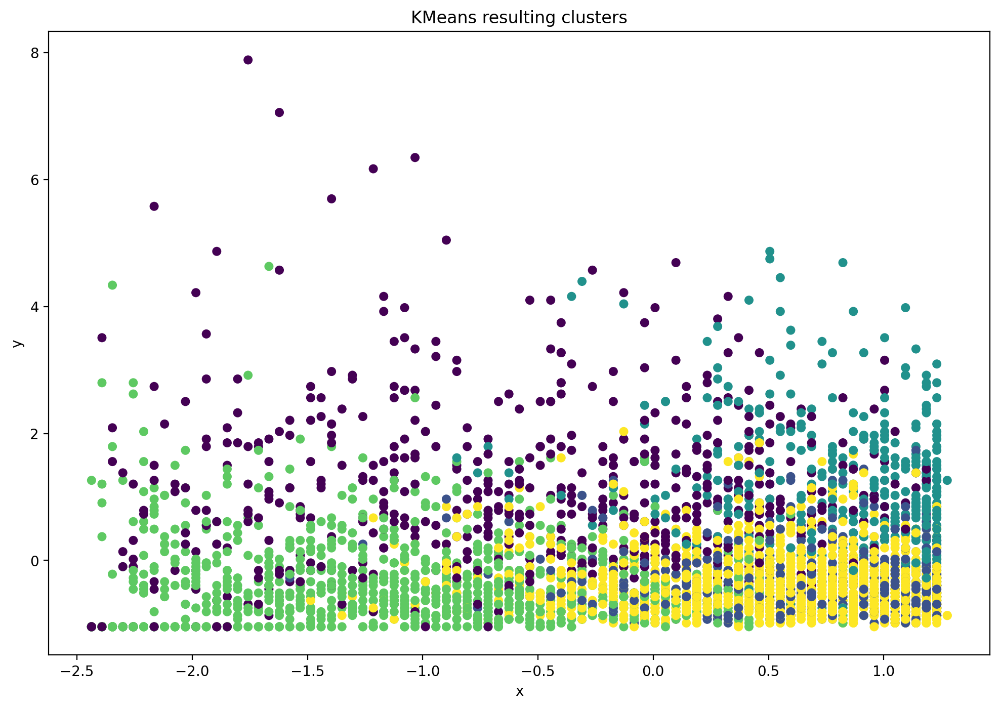

In [84]:
plt.figure(figsize=(12,8))
plt.scatter(X_np[:,1], X_np[:,20], c=kmeans.labels_, s=30, cmap='viridis')
plt.xlabel('x')
plt.ylabel('y')
plt.title('KMeans resulting clusters')

### 🦣 Визуализируем кластеры по каждому признаку относительно FG%

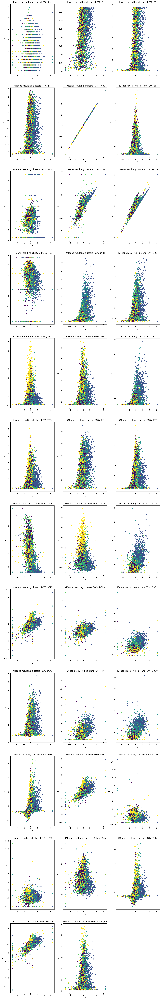

In [86]:
plt.figure(figsize= (15,100))
count = 4
for i in range(len(X.columns)):
    plt.subplot(12, 3, i + 1)
    plt.scatter(X_np[:,count], X_np[:,i], c=y, s=20, cmap='viridis')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title(f'KMeans resulting clusters {X.columns[count]}, {X.columns[i]}')

### 🐨 Визуализируем kmeans кластеры по каждому признаку относительно FG%

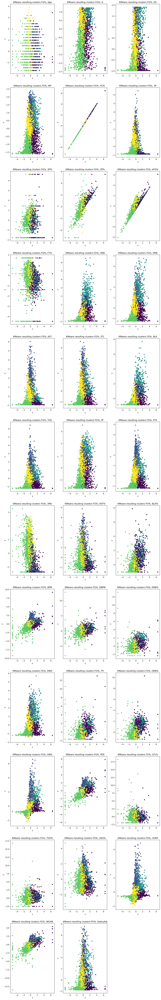

In [87]:
plt.figure(figsize= (15,100))
count = 4
for i in range(len(X.columns)):
    plt.subplot(12, 3, i + 1)
    plt.scatter(X_np[:,count], X_np[:,i], c=kmeans.labels_, s=20, cmap='viridis')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title(f'KMeans resulting clusters {X.columns[count]}, {X.columns[i]}')

### 🐦‍⬛ Выведем на экран значения метрик качества кластеризации

In [85]:
print('homogeneity_score =', metrics.homogeneity_completeness_v_measure(y, kmeans.labels_))
print('silhouette_score =', metrics.silhouette_score(X_np, kmeans.labels_))
print('accuracy_score =', metrics.accuracy_score(y, kmeans.labels_))

homogeneity_score = (0.18050711070393718, 0.1934645946995967, 0.18676137530271267)
silhouette_score = 0.1648474245165286
accuracy_score = 0.18108651911468812


🐖 Для сравнения я выбрала метрики homogeneity_completeness_v_measure, silhouette_score и accuracy_score. Первая метрика показывает 3 показателя качества кластеризации: однородность, полноту и v-меру. Вторая метрика silhouette_score рассчитывается с использованием среднего расстояния внутри кластера и среднего расстояния до ближайшего кластера для каждой выборки.

### 🐆 Теперь попробуем сделать кластеризацию с помощью ```AgglomerativeClustering```.
[Документация](https://scikit-learn.org/stable/modules/generated/sklearn.cluster.AgglomerativeClustering.html)

In [88]:
%%time
#☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️
from sklearn.cluster import AgglomerativeClustering

agglo_clustering = AgglomerativeClustering(n_clusters = 3).fit(X_np)

CPU times: user 556 ms, sys: 35.8 ms, total: 592 ms
Wall time: 592 ms


### 🦛 Визуализируем agglomerative кластеры по каждому признаку относительно FG%

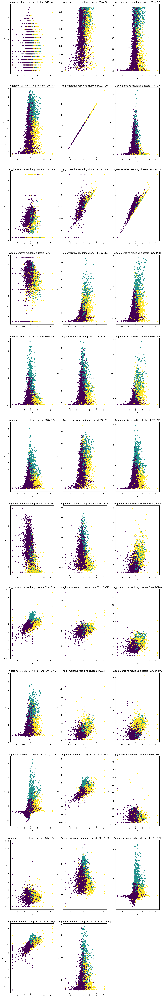

In [92]:
plt.figure(figsize= (15,100))
count = 4
for i in range(len(X.columns)):
    plt.subplot(12, 3, i + 1)
    plt.scatter(X_np[:,count], X_np[:,i], c=agglo_clustering.labels_, s=20, cmap='viridis')
    plt.xlabel('x')
    plt.ylabel('y')
    plt.title(f'Agglomerative resulting clusters {X.columns[count]}, {X.columns[i]}')

In [90]:
#☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️
print('homogeneity_score=', metrics.homogeneity_completeness_v_measure(y, agglo_clustering.labels_))
print('silhouette_score=', metrics.silhouette_score(X_np, agglo_clustering.labels_))
print('accuracy_score=', metrics.accuracy_score(y, agglo_clustering.labels_))

homogeneity_score= (0.14715072464251536, 0.25590391099179133, 0.18685529261825293)
silhouette_score= 0.16198870121285916
accuracy_score= 0.3272132796780684


### 🦏 Попробуем DBSCAN

In [ ]:
#☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️
from sklearn.cluster import DBSCAN


plt.figure(figsize= (15,100))
i = 1
for samples in range(2, 50, 2):
    for e in range(4, 20, 2):
        #%time
        dbscan = DBSCAN(eps=e, min_samples=samples)
        clusters = dbscan.fit_predict(X_np)
        plt.subplot(75, 3, i)
        plt.scatter(X_np[:,1], X_np[:,3], c=clusters, s=10, cmap='viridis')
        plt.title('eps = {}, min_samples = {}'.format(e, samples))
        try:
            print('eps=',e,'n=',samples,'score:',metrics.silhouette_score(X_np, clusters))
        except ValueError:
            print('eps=',e,'n=',samples,'score:',-1)
        i += 1
print(i)
plt.show()

### 🦉 Попробуем MeanShift

In [95]:
#☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️
from sklearn.cluster import MeanShift, estimate_bandwidth


bandwidth = estimate_bandwidth(X_pca, quantile=0.2, n_samples=1000)
meanshift = MeanShift(bandwidth=bandwidth)
meanshift.fit(X_np)
print('homogeneity_score=', metrics.homogeneity_completeness_v_measure(y, meanshift.labels_))
print('silhouette_score=', metrics.silhouette_score(X_np, meanshift.labels_))
print('accuracy_score=', metrics.accuracy_score(y, meanshift.labels_))

homogeneity_score= (0.01857103832899685, 0.09577714219801371, 0.03110991308481635)
silhouette_score= 0.17029503692053688
accuracy_score= 0.22032193158953722


In [98]:
labels = meanshift.labels_
cluster_centers = meanshift.cluster_centers_

labels_unique = np.unique(labels)
n_clusters_ = len(labels_unique)

print("number of estimated clusters : %d" % n_clusters_)

number of estimated clusters : 54


Text(0.5, 1.0, 'MeanShift resulting clusters')

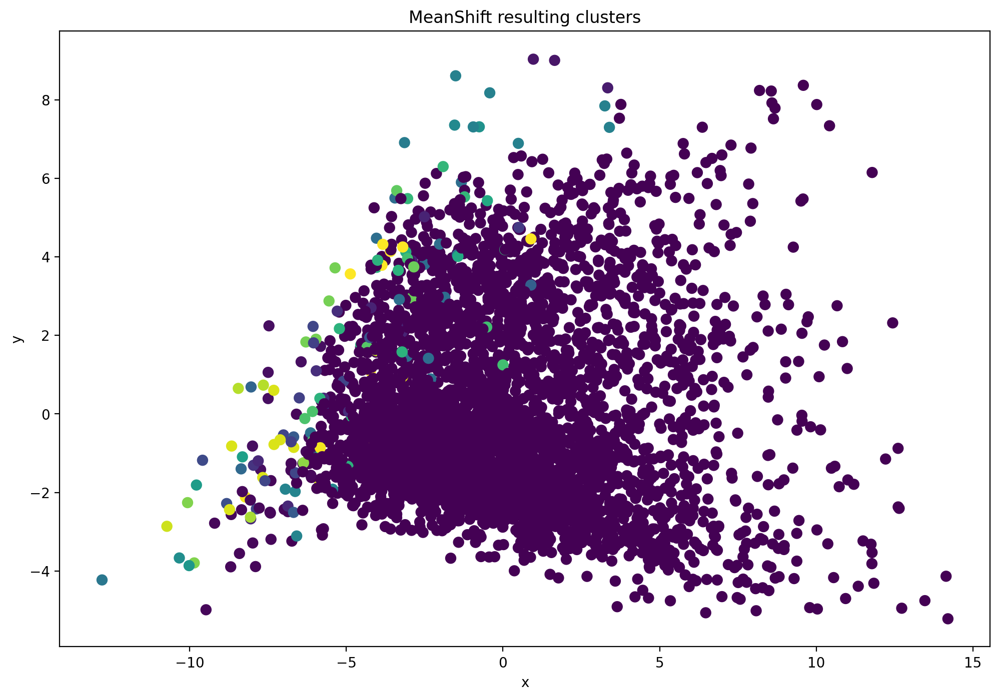

In [103]:
#☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️
plt.figure(figsize=(12,8))
plt.scatter(X_pca[:,0], X_pca[:,1], c=meanshift.labels_, s=50, cmap='viridis')
plt.xlabel('x')
plt.ylabel('y')
plt.title('MeanShift resulting clusters')

### 🦚 Попробуем Birch

In [114]:
#☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️
from sklearn.cluster import Birch


birch = Birch(threshold=4, n_clusters=5)
birch.fit(X_pca)
print('homogeneity_score=', metrics.homogeneity_completeness_v_measure(y, birch.labels_))
print('silhouette_score=', metrics.silhouette_score(X_pca, birch.labels_))
print('accuracy_score=', metrics.accuracy_score(y, birch.labels_))

homogeneity_score= (0.025310921359953588, 0.04737093891177453, 0.03299315964287391)
silhouette_score= 0.16842420256445237
accuracy_score= 0.2711267605633803


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Text(0.5, 1.0, 'Birch resulting clusters')

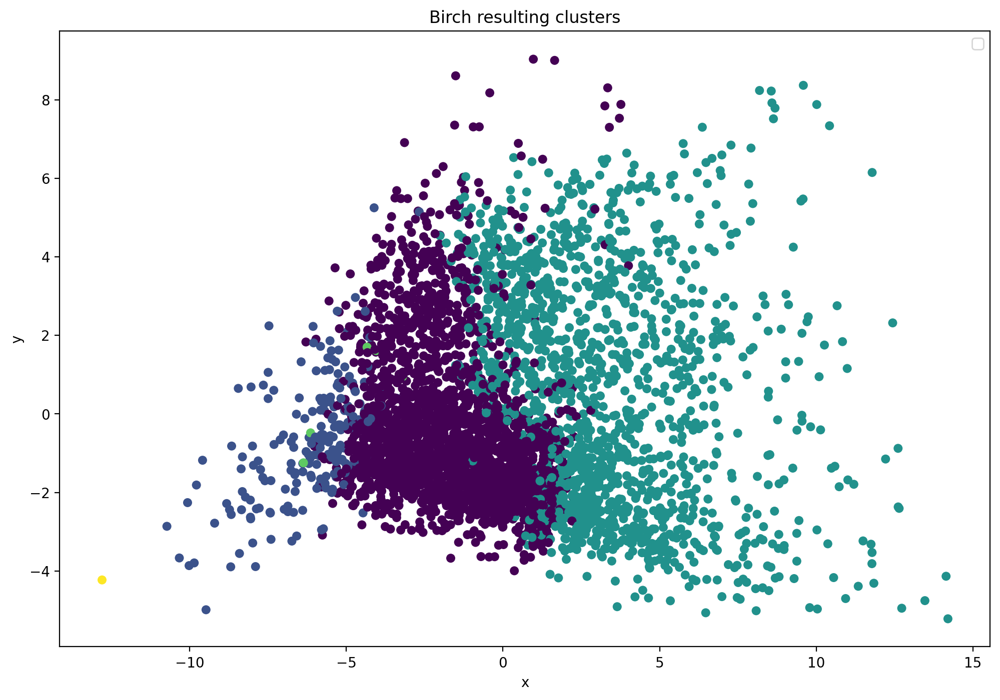

In [116]:
#☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️☁️
plt.figure(figsize=(12,8))
plt.scatter(X_pca[:,0], X_pca[:,1], c=birch.labels_, s=30, cmap='viridis')
plt.xlabel('x')
plt.ylabel('y')
plt.legend()
plt.title('Birch resulting clusters')

In [121]:
from sklearn.metrics import confusion_matrix
clusters = [0, 1, 2, 3, 4]
confusion_matrix(kmeans.labels_, y, labels=clusters);

In [122]:
np.unique(kmeans.labels_)

array([0, 1, 2, 3, 4], dtype=int32)

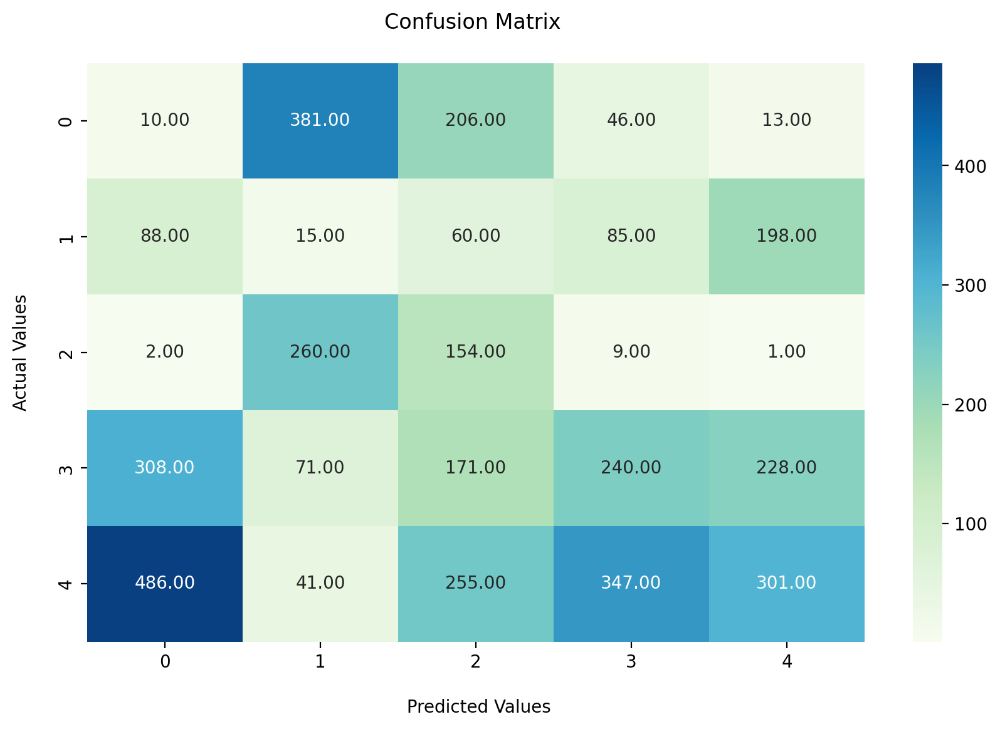

In [123]:
plt.figure(figsize=(10,6))
fx=sns.heatmap(confusion_matrix(kmeans.labels_, y), annot=True, fmt=".2f",cmap="GnBu")
fx.set_title('Confusion Matrix \n');
fx.set_xlabel('\n Predicted Values\n')
fx.set_ylabel('Actual Values\n');
fx.xaxis.set_ticklabels(clusters)
fx.yaxis.set_ticklabels(clusters)
plt.show()

### 🪿 Попробуем выделить кластеры при помощи [спектральной кластеризации](http://scikit-learn.org/stable/modules/clustering.html#spectral-clustering).

In [ ]:
from sklearn.cluster import SpectralClustering

scpectral_clustering = SpectralClustering(n_clusters=5,
                                          assign_labels='discretize',
                                          random_state=0).fit(X_pca)
print('homogeneity_score=', metrics.homogeneity_completeness_v_measure(y, scpectral_clustering.labels_))
print('silhouette_score=', metrics.silhouette_score(X_pca, scpectral_clustering.labels_))
print('accuracy_score=', metrics.accuracy_score(y, scpectral_clustering.labels_))